# ** Vehicle Detection and Tracking **

The goal of this project is detecting vehicle in an image or video, frame by frame. Here is detail:
* Perform a Histogram of Oriented Gradients(HOG) feature extraction on a labled traning set of images.
* Apply color transform and append binned color features to HOG feature vector.
* Normalize features and randomize a selection for training and testing.
* Train a Linear SVM classifer.
* Implemen a sliding-window technique and use trained classifier to search for vehicles in images.
* Run pipeline on a set of test images.
* Run pipeline on a vide stream and create a recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicle detected.

In [1]:
import os
import cv2
import glob
import pickle
import glob
import time
import math
import numpy as np
from moviepy.editor import VideoFileClip

from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split

from scipy.ndimage.measurements import label

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec

In [2]:
# Define utility functions
def get_hog_features(img, orientations, pixels_per_cell, cells_per_block, visualise=False, feature_vector=True):
    """ Return HOG features and visualization """
    if visualise == True:
        features, img_hog = hog(img, orientations=orientations, pixels_per_cell=(pixels_per_cell, pixels_per_cell), 
                                cells_per_block=(cells_per_block, cells_per_block), 
                                transform_sqrt=False, visualise=True, feature_vector=feature_vector)
        return features, img_hog
    else:
        features = hog(img, orientations=orientations, pixels_per_cell=(pixels_per_cell, pixels_per_cell)
                       , cells_per_block=(cells_per_block, cells_per_block), 
                       transform_sqrt=False, visualise=False, feature_vector=feature_vector)
        return features

def bin_spatial(img, size=(32, 32)):
    """ Compute binned color features. Use three color channels """
    r_spatial = cv2.resize(img[:,:,0], size).ravel()
    g_spatial = cv2.resize(img[:,:,1], size).ravel()
    b_spatial = cv2.resize(img[:,:,2], size).ravel()

    features = np.hstack((r_spatial, g_spatial, b_spatial))
    return features

def color_hist(img, nbins=32, bin_range=(0, 256)):
    """ Computer histogra color features """
    r_hist = np.histogram(img[:,:,0], bins=nbins, range=bin_range)
    g_hist = np.histogram(img[:,:,1], bins=nbins, range=bin_range)
    b_hist = np.histogram(img[:,:,2], bins=nbins, range=bin_range)

    features = np.concatenate((r_hist[0], g_hist[0], b_hist[0]))
    return features

def extract_features_single_image(img, color_space='RGB', spatial_size=(32, 32),
                                  hist_nbins=32, hist_bin_range=(0, 256), 
                                  orientations=9, pixels_per_cell=8, cells_per_block=2, hog_channel=0):        
    """Extract features of an image. features includes hog, color histogram, and bin spatials """

    # Create an empty list to append feature vectors to
    features = []

    # Apply color conversion if it is other than RGB
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else:
        feature_image = np.copy(img)

    # Compute spatial feature
    spatial_features = bin_spatial(feature_image, spatial_size)
    features.append(spatial_features)

    # Compute color histogram feature
    hist_features = color_hist(feature_image, hist_nbins, hist_bin_range)
    features.append(hist_features)

    # Compute HOG feature
    if hog_channel == 'ALL':
        hog_features = []

        channles = feature_image.shape[2]
        for channel in range(channles):
            hog_feature = get_hog_features(feature_image[:,:,channel], orientations, pixels_per_cell, cells_per_block, visualise=False, feature_vector=True)
            hog_features.append(hog_feature)

        hog_features = np.ravel(hog_features)
    else:
        hog_features = get_hog_features(feature_image[:,:,hog_channel], orientations, pixels_per_cell, cells_per_block, visualise=False, feature_vector=True)

    features.append(hog_features)

    return np.concatenate(features)

def extract_features(img_files, color_space='RGB', spatial_size=(32, 32),
                     hist_nbins=32, hist_bin_range=(0, 256), 
                     orientations=9, pixels_per_cell=8, cells_per_block=2, hog_channel=0):
    """Extract features of a list of images. This function read an image and call extract_features_single_image for that """
    features = []

    for file in img_files:
        img = mpimg.imread(file)
        feature = extract_features_single_image(img, color_space, spatial_size, hist_nbins, hist_bin_range,
                                                orientations, pixels_per_cell, cells_per_block, hog_channel);
        features.append(feature)

    return features

def find_cars(img, y_start, y_stop, scale, clf, scaler, orientations, pixels_per_cell, cells_per_block, spatial_size, hist_nbins):
    """ Define a single function that can extract features using hog sub-sampling and make predictions """

    # Scale image to [0..1]
    img = img.astype(np.float32)/255
    
    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    
    # Select the interested part of image
    img_to_search = img[y_start:y_stop,:,:]
    img_to_search = convert_color(img_to_search, conv='RGB2YCrCb')

    # Scale the image (if needed)
    if scale != 1:
        shape = img_to_search.shape
        img_to_search = cv2.resize(img_to_search, (np.int(shape[1]/scale), np.int(shape[0]/scale)))

    # Extract channels
    ch1 = img_to_search[:,:,0]
    ch2 = img_to_search[:,:,1]
    ch3 = img_to_search[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pixels_per_cell) - 1
    nyblocks = (ch1.shape[0] // pixels_per_cell) - 1 
    nfeatures_per_block = orientations*cells_per_block**2

    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pixels_per_cell) - 1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orientations, pixels_per_cell, cells_per_block, feature_vector=False)
    hog2 = get_hog_features(ch2, orientations, pixels_per_cell, cells_per_block, feature_vector=False)
    hog3 = get_hog_features(ch3, orientations, pixels_per_cell, cells_per_block, feature_vector=False)

    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step

            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pixels_per_cell
            ytop = ypos*pixels_per_cell

            # Extract the image patch
            subimg = cv2.resize(img_to_search[ytop:ytop+window, xleft:xleft+window], (window, window))

            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_nbins)

            # Scale features
            X = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
            scaled_X = scaler.transform(X)

            # Make prediction
            prediction = clf.predict(scaled_X)
            if prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                

    return heatmap

def convert_color(img, conv='RGB2YCrCb'):
    """ Convert image color channel """
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def add_heat(heatmap, bbox_list):
    """ Update heatmap with box list """
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    
    return heatmap

def apply_threshold(heatmap, threshold):
    """ Zero out pixels below the threshold """
    heatmap[heatmap <= threshold] = 0
    return heatmap

def draw_labeled_bboxes(img, labels):
    """ Draw labled boxes on the image """
    for i in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == i).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0, 0, 255), 6)

    return img

In [3]:
# Define Parameters
color_space = 'YCrCb'
orientations = 9
pixels_per_cell = 8
cells_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2
spatial_size = (32, 32) # Spatial binning size
hist_nbins = 32 # Number of histogram bins
hist_bin_range = (0, 256) # The range of histogram bins

# ** Traning and Feature Extraction **
I've used the traing set provided by Udacity which consisted 8792 vehicle and 8968 non-vehicle samples. Each image was 64 x 64 x 3. 

My feature vector include HOG features, spatial color binning, and color histogram. 
1. HOG feature extraction method consists of breaking image into cells and then measuring the strongest gradient direction in each cell. The cell size used for calculating hog was 8 x 8 cells when each cell was 8 x 8 pixels. Furthermore orientation of each gradient groupped into one of 9 different resolution bins and finally each cell with its orientation bin was unraveled per color channel and storeg to 1-dimensional future vector.
2. Spatial color binning consisted of a down sampled input image of 32 x 32 pixels and unraveled into a 1-dimensional vector as well.
3. Color histogram used 32 different bins of reach color channel and (0, 256) for the range of histogram bins.


I spent some time to explore different color spaces to determine which would give the best result in terms of prediction accuracy. I finally settled down on **YcrCb** becuase it gave high test accuracy and also gave fewest false positive in test videos.


With described feature vector and using large dataset, the SVC was able to achieve 99% classification accuracy with a test set that was 20% of the original data.

In [16]:
class DataSource:
    def __init__(self):
        self.file_name = "train_data.p"
        self.is_trained = False

        if os.path.exists(self.file_name):
            self.load_data()
            self.load_trainer()
        else:
            self.load_data()
            self.extract_data_features()
            self.split_data()
        
    def load_data(self):
        """ Load data """
        self.vehicles = glob.glob('./data/vehicles/*/*png')
        self.non_vehicles = glob.glob('./data/non-vehicles/*/*png')
        
        print('Number of vehicles images: ',len(self.vehicles))
        print('Number of non vehicles images: ',len(self.non_vehicles))
        
    def extract_data_features(self):
        print('\nExtracting features...')
        vehicle_features = extract_features(self.vehicles, color_space, spatial_size, hist_nbins, hist_bin_range,
                                              orientations, pixels_per_cell, cells_per_block, hog_channel)
                
        non_vehicle_features = extract_features(self.non_vehicles, color_space, spatial_size, hist_nbins, hist_bin_range, 
                                              orientations, pixels_per_cell, cells_per_block, hog_channel)
        
        # Create an array stack of feature vectors
        X = np.vstack((vehicle_features, non_vehicle_features)).astype(np.float64)
        # Fit a per-column scaler
        X_scaler = StandardScaler().fit(X)
        # Apply the scaler to X
        scaled_X = X_scaler.transform(X)

        # Define the label vector
        y = np.hstack((np.ones(len(vehicle_features)), np.zeros(len(non_vehicle_features))))
        
        self.scaler = X_scaler
        self.X = scaled_X
        self.y = y
        
        print('Extracting features is done')
        
    def split_data(self, test_size=0.2):
        """ Split up data into train and test set """
        rand_state = np.random.randint(0, 100)
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=test_size, random_state=rand_state)

        print()
        print('Number of train data: ', len(self.X_train))
        print('Number of test data: ', len(self.X_test))
        
    def train(self):
        """ Train a linear SVC with training data and calculate accuracy """
        print('\nTraning...')
        
        # Use a linear SVC
        clf = LinearSVC()
        
        t1 = time.time()
        clf.fit(self.X_train, self.y_train)
        t2 = time.time()
        print(round(t2-t1, 2),'seconds to train SVC')

        # Check the SVC score
        print('Train Accuracy of SVC =', round(clf.score(self.X_train, self.y_train), 4))
        print('Test Accuracy of SVC =', round(clf.score(self.X_test, self.y_test), 4))
        
        self.clf = clf
        self.is_trained = True

    def plot_sampel_hog_images(self):
        print('\nHOG features for car and non car images')
        
        # Plot images
        fig = plt.figure(figsize=(10,60))
        fig.subplots_adjust(wspace=1)

        # Select random vehicle image
        rnd = np.random.randint(0, len(self.vehicles))
        img_vehicle = mpimg.imread(self.vehicles[rnd])
        img_vehicle_gray = cv2.cvtColor(img_vehicle, cv2.COLOR_RGB2GRAY)
        features, img_vehicle_hog = get_hog_features(img_vehicle_gray, orientations, pixels_per_cell,
                                                     cells_per_block, visualise=True, feature_vector=True)
        plt.subplot(141)
        plt.imshow(img_vehicle, cmap='gray')
        plt.title('Example Car Image')
        plt.subplot(142)
        plt.imshow(img_vehicle_hog, cmap='hot')
        plt.title('HOG Visualization')

        # Select random non vehicle image
        rnd = np.random.randint(0, len(self.non_vehicles))
        img_non_vehicle = mpimg.imread(self.non_vehicles[rnd])
        img_non_vehicle_gray = cv2.cvtColor(img_non_vehicle, cv2.COLOR_RGB2GRAY)
        features, img_non_vehicle_hog = get_hog_features(img_non_vehicle_gray, orientations, pixels_per_cell,
                                                         cells_per_block, visualise=True, feature_vector=True)
        plt.subplot(143)
        plt.imshow(img_non_vehicle, cmap='gray')
        plt.title('Example Non Car Image')
        plt.subplot(144)
        plt.imshow(img_non_vehicle_hog, cmap='hot')
        plt.title('HOG Visualization')
        plt.show()
        
    def save_trainer(self):
        data_dict = {
            'clf': self.clf,
            'scaler': self.scaler
        }
        
        pickle.dump(data_dict, open(self.file_name, "wb"))
        print('\nThe trainer has been saved')
        
    def load_trainer(self):
        data_dict = pickle.load(open(self.file_name, "rb" ))
        
        self.clf = data_dict["clf"]
        self.scaler = data_dict["scaler"]
        self.is_trained = True
        
        print('\nThe trainer has been loaded')
        

# Load data and train the classifier
source = DataSource()        
if source.is_trained != True:
    source.train()
    source.save_trainer()

Number of vehicles images:  8792
Number of non vehicles images:  8968

The trainer has been loaded


# ** Histogram Of Oriented Gradients (HOG) **
With above descriptin, you can see HOG representation of a sample vehicle and non-vehicle image.


HOG features for car and non car images


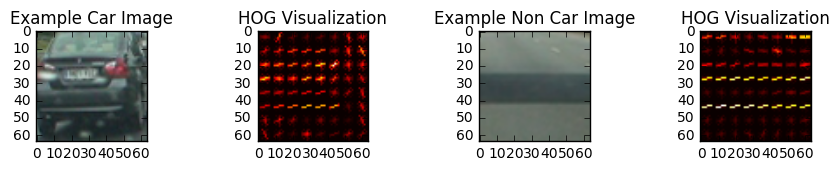

In [8]:
source.plot_sampel_hog_images()

# ** Image Piepline **
Once the SVC classifier working well, I used these approach to detect cars in an image.

First of all, I narrow the search space to regions where car ar likely to appear. This mean I never search in the sky for the car and choose to search [0:1280, 400:656]. 

In order to improve the efficiency of extarcting hog features, the hog feature of entire image(a defined area) calculated once and then using a scaling based on the 8 x 8 pixel cells to slide and search for windows. The smallest search window is 64 x 64 pixels and larger windows could be made by extending 8 pixels to either x or y dimensions. In next step, the target window is resized to 64 x 64 pixels and then spatial and histogram features have been extracted for this resized window. In this project, 5 different scale search windows were used from scale 1x to 2x in increment of 0.2. So search windows were 64x64, 77x77, 90x90, 102x102, 115x115, and 128x128.

In next step, I added the heatmp output of above search to a overall heatmap, then thresholded this heatmap, so only areas with minimum number of overlaps would be considered of detections. This considerably helped removing false positives from the heatmap. The heatmap was given to labels function which grouped nearby areas into different box detections which could be drawn onto original image.

In [26]:
def process_image(img):
    """ Porcess image in order to detect features, detect cars, and draw box around them """
    # Create heatmap
    heatmap = np.zeros_like(img[:,:,0]).astype(np.float32)

    for scale in np.arange(1,2.,.2):
        # Create heat maps for different scales
        heat = find_cars(img, ystart, ystop, scale, source.clf, source.scaler, orientations, 
                         pixels_per_cell, cells_per_block, spatial_size, hist_nbins)
        heatmap += heat

    # Apply threshold to help remove false positives
    heatmap = apply_threshold(heatmap, 2)
    
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heatmap, 0, 255)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)

    # Draw bounding boxes on the copy of image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    
    return draw_img, heatmap

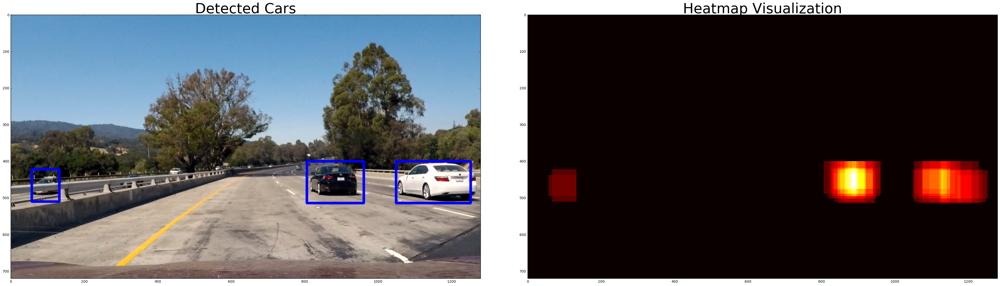

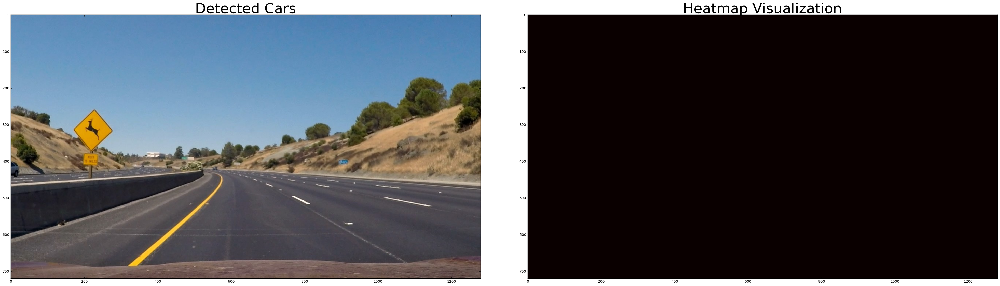

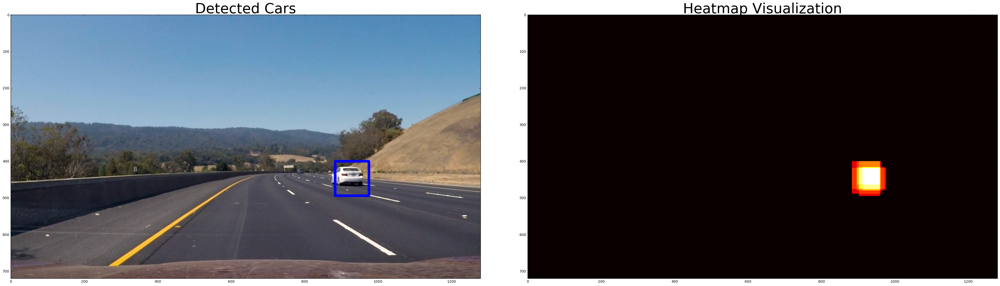

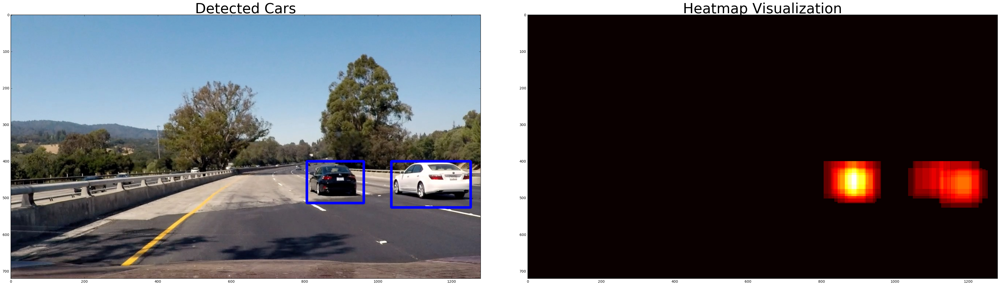

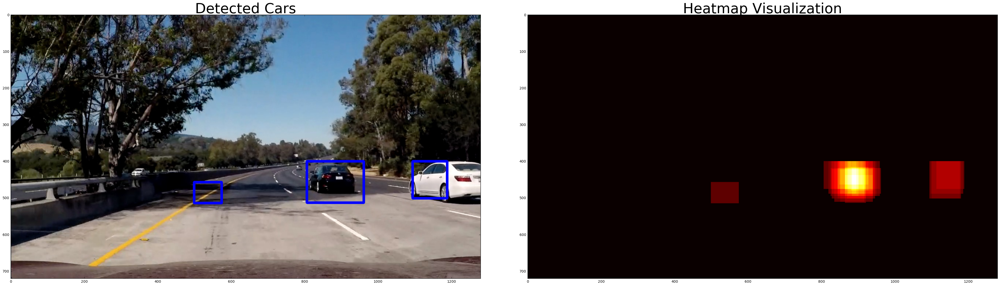

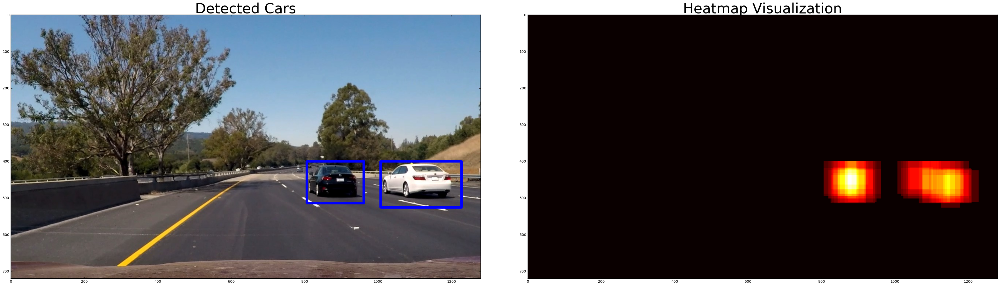

In [27]:
images = glob.glob('./test_images/test*.jpg')

# Define the y range to search for cars (bottom of image)
ystart = 400
ystop = 656

for image in images:
    img = mpimg.imread(image)
    processed_img, heatmap = process_image(img)
    
    # Plot images
    fig = plt.figure(figsize=(50,100))
    fig.subplots_adjust(wspace=0.1)
    plt.subplot(121)
    plt.imshow(processed_img)
    plt.title('Detected Cars', fontsize=40)
    plt.subplot(122)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heatmap Visualization', fontsize=40)
    plt.show()


# ** Video Pipeline **

Video pipeline used all methods as the image pipeline but also handle car tracking in track_cars() function. Also a Car class is used to store all detected car positions and averaging them as an output to smooth recorded result on the original image. In track_car() function, new detections with old dectections are compared and when a new detection is not matched with an old detection, it would be added as a new car to car list. Also when an old detection wasn't matched with a new detection, that car is demoted. If a car demoted  3 times, it would be deleted from car list. Likewise a car needed to be detected 3 times before it could be displayed.

For video, heatmaps were created by considering a series of consecutive frames and adding together each individual frames heatmap together, then thresholding the final result by value of 5.

Here is the [link](https://youtu.be/N5xYGZE7ebE) to my video result

Also, I combined this pipeline with advanced lane finding pipeline (project 4). In the result video you can see detected lines and detected cars together. Here is the [link](https://youtu.be/cJwUSUakzN0)

In [28]:
# Used for saving car position, width, heigh, and car's postion between frames (car history)
class Car():
    HIGHEST_RANK = 1000
    
    def __init__(self, x_position, y_position, width, height):
        self.x_positions = []
        self.x_positions.append(x_position)
        self.y_positions = []
        self.y_positions.append(y_position)
        self.width = []
        self.width.append(width)
        self.height = []
        self.height.append(height)
        
        self.detected = False
        self.n_detections = 1 # Number of consecutive that car has been detected
        self.n_nondetections = 0 # Number of consecutive that car has not been detected since last detection
        
    def rank(self, x_position, y_position):
        """ measure the distance between input position and past positions """
        rank = math.sqrt((x_position - self.x_positions[-1])**2 + (y_position - self.y_positions[-1])**2)
        # if distance is greater than 40, return MAX_RANK
        if rank < 40:
            return rank
        else:
            return self.HIGHEST_RANK
        
    def update_position(self, x_position, y_position, width, height):
        """ Append new position and update detections and nondetections values """
        self.x_positions.append(x_position)
        self.y_positions.append(y_position)
        self.width.append(width)
        self.height.append(height)
        self.n_detections += 1
        self.n_nondetections = 0
        self.detected = self.n_detections >= 3
            
    def demote(self):
        """ Demote the car """
        self.n_nondetections += 1

    def get_box(self):
        """ Average last 5 positions and return the box around the car"""
        factor = 5
        x_position = int(np.average(self.x_positions[-factor:], axis=0))
        y_position = int(np.average(self.y_positions[-factor:], axis=0))
        width = int(np.average(self.width[-factor:], axis=0))
        height = int(np.average(self.height[-factor:], axis=0))
        
        return ((x_position, y_position), (x_position + width, y_position + height))
    
    def is_valid(self):
        """ Return true if car is negative detections is less than 3 """
        return self.n_nondetections <= 3


def process_video_frame(frame):
    global cars, heatmaps
    
    # Create heatmap
    heatmap = np.zeros_like(frame[:,:,0]).astype(np.float32)
    
    # Iterate through different scales
    for scale in np.arange(1,2.,.2):
        # Create heat maps for different scales
        heat = find_cars(frame, ystart, ystop, scale, source.clf, source.scaler, orientations, 
                         pixels_per_cell, cells_per_block, spatial_size, hist_nbins)
        heatmap += heat
    
    # add to heatmap list
    heatmaps.append(heatmap)

    # Sum last 5 heatmap
    heatmap = sum_heatmap(frame, 5)
    
    # Apply threshold to help remove false positives
    heatmap = apply_threshold(heatmap, 5)
    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)

    # Resolve box overlaps
    detections = resolve_box_overlaps(labels)

    # Track cars and update old with new car detection
    cars = track_cars(detections, cars)

    # Draw bounding boxes on the copy of image
    draw_frame = draw_car_boxes(np.copy(frame), cars)

    return draw_frame

def track_cars(detections, cars):
    # If car list is empty, consider all detections as new car
    if len(cars) == 0:
        for detection in detections:
            cars.append(Car(detection[0], detection[1], detection[2], detection[3]))

    elif len(detections) == 0:
        for car in cars:
            if car.demote():
                cars.remove(car)
    
    else:
        # What detections can be a new car
        detection_update = np.zeros(len(detections))
        
        # What cars need to get removed
        remove_update = np.zeros(len(cars))
        
        # Keep track of relation between new and existing detections
        grid = np.zeros((len(detections), len(cars) + 1))
        
        # Iterate through new detections
        for dt in range(len(detections)):
            # Iterate through existing detected cars
            for cr in range(len(cars)):
                detection = detections[dt]
                grid[dt, cr] = cars[cr].rank(detection[0], detection[1])
            
            # Store closest old detection to new detection
            grid[dt, len(cars)] = np.argmin(grid[dt][:-1])

        # Iterate through existing detected cars
        for cr in range(len(cars)):
            # Iterate through new detections
            for dt in range(len(detections)):
                if grid[dt][-1] != cr:
                    grid[dt, cr] = Car.HIGHEST_RANK

            # If rank between old and new detection is good enough
            if np.amin(grid[:, cr]) < Car.HIGHEST_RANK:
                # Update the car position
                detection = detections[np.argmin(grid[:, cr])]
                cars[cr].update_position(detection[0], detection[1], detection[2], detection[3])
                detection_update[np.argmin(grid[:, cr])] = 1
            else:
                # Add car to be removed later
                remove_update[cr] = 1

        # Add new detections to list as new cars
        for dt in range(len(detections)):
            if detection_update[dt] == 0:
                detection = detections[dt]
                cars.append(Car(detection[0], detection[1], detection[2], detection[3]))
             
        # Remove the old detections the didn't have detected again
        remove_index = []
        for i in range(len(remove_update)):
            if remove_update[i] == 1:
                car = cars[i]
                car.demote()
                if car.is_valid() == False:
                    remove_index.append(i)
        
        cars = np.delete(cars, remove_index)
        cars = cars.tolist()
    
    return cars

def draw_car_boxes(img, cars):
    # Iterate through all detected cars
    for i in range(len(cars)):
        if cars[i].detected:
            box = cars[i].get_box()
            cv2.rectangle(img, box[0], box[1], (0, 200, 0), 5) 

    return img
    
def sum_heatmap(img, n):
    heatmap = np.zeros_like(img[:,:,0])

    n = min(5, len(heatmaps))
    for i in np.arange(1, n):
        heatmap += heatmaps[-i].astype(np.uint8)
        
    return heatmap

def resolve_box_overlaps(labels):
    boxes = []
    
    for i in range(1, labels[1] + 1):
        nonzero = (labels[0] == i).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        x = np.min(nonzerox)
        y = np.min(nonzeroy)
        
        width = np.max(nonzerox) - x
        height = np.max(nonzeroy) - y
        
        boxes.append([x, y, width, height])

    return boxes

In [ ]:
# Save heatmaps and detected cars
heatmaps = []
cars = []

# Define the y range to search for cars (bottom of image)
ystart = 400
ystop = 656

# Process the video
clip = VideoFileClip("./test_videos/project_video.mp4")
output_video = "./test_videos/project_video_processed.mp4"
output_clip = clip.fl_image(process_video_frame)
output_clip.write_videofile(output_video, audio=False)

# ** Further Improvement **

1. The main issue with the video pipeline was speed. It takes about 2.5 seconds to process each frame on Mac laptop. I would like to try to implement that with a Deep Learning approach in order to increas the speed.
2. The pipeline would probably fail in situations where our car was going up or down steep hills because the region I look is hard coded. In these case, I would add codes to calculate the region for search based on the road steep.